In [1]:
import os
import random
import shutil
import cv2
import glob
from PIL import Image,ImageDraw,ImageFont
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch.utils.data import Dataset,DataLoader
import torch.nn as nn
import torchvision
from torchvision import transforms as transforms
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
train_path="/kaggle/input/car-object-detection/data/training_images/"
test_path="/kaggle/input/car-object-detection/data/testing_images/"
#データフレームを作成　数字は小数点以下第1位に統一
df=pd.read_csv("/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv")
df["xmin"]=round(df["xmin"],1)
df["ymin"]=round(df["ymin"],1)
df["xmax"]=round(df["xmax"],1)
df["ymax"]=round(df["ymax"],1)
df['x_center']=round((df['xmin'] + df['xmax'])/2,1) #xの中心座標
df['y_center']=round((df['ymin'] + df['ymax'])/2,1) #yの中心座標
df['width']=round(df['xmax'] - df['xmin'],1) #xの幅
df['height']=round(df['ymax'] - df['ymin'],1) #yの幅
df['classes']=1 #今回はすべて車なので1で統一  0はデフォルトで背景を意味していて、予測時のエラーにつながるので基本的には使わない
df

,image,xmin,ymin,xmax,ymax,x_center,y_center,width,height,classes
0,vid_4_1000.jpg,281.3,187.0,327.7,223.2,304.5,205.1,46.4,36.2,1
1,vid_4_10000.jpg,15.2,187.0,120.3,236.4,67.8,211.7,105.1,49.4,1
2,vid_4_10040.jpg,239.2,176.8,362.0,236.4,300.6,206.6,122.8,59.6,1
3,vid_4_10020.jpg,496.5,172.4,630.0,231.5,563.2,202.0,133.5,59.1,1
4,vid_4_10060.jpg,16.6,186.5,132.6,238.4,74.6,212.4,116.0,51.9,1
...,...,...,...,...,...,...,...,...,...,...
554,vid_4_9860.jpg,0.0,198.3,49.2,236.2,24.6,217.2,49.2,37.9,1
555,vid_4_9880.jpg,329.9,156.5,536.7,250.5,433.3,203.5,206.8,94.0,1
556,vid_4_9900.jpg,0.0,168.3,141.8,239.2,70.9,203.8,141.8,70.9,1
557,vid_4_9960.jpg,487.4,172.2,616.9,228.8,552.2,200.5,129.5,56.6,1


In [3]:
test_img_list=os.listdir(test_path)
train_img_list=os.listdir(train_path)
train_img_list

['vid_4_16960.jpg',
 'vid_4_28440.jpg',
 'vid_4_12460.jpg',
 'vid_4_2460.jpg',
 'vid_4_13700.jpg',
 'vid_4_17620.jpg',
 'vid_4_19960.jpg',
 'vid_4_1040.jpg',
 'vid_4_820.jpg',
 'vid_4_11420.jpg',
 'vid_4_20480.jpg',
 'vid_4_22060.jpg',
 'vid_4_7740.jpg',
 'vid_4_26700.jpg',
 'vid_4_9800.jpg',
 'vid_4_14480.jpg',
 'vid_4_19460.jpg',
 'vid_4_3880.jpg',
 'vid_4_28340.jpg',
 'vid_4_9680.jpg',
 'vid_4_11000.jpg',
 'vid_4_19260.jpg',
 'vid_4_12480.jpg',
 'vid_4_16740.jpg',
 'vid_4_3120.jpg',
 'vid_4_9620.jpg',
 'vid_4_10760.jpg',
 'vid_4_11500.jpg',
 'vid_4_28200.jpg',
 'vid_4_21440.jpg',
 'vid_4_14700.jpg',
 'vid_4_27040.jpg',
 'vid_4_25900.jpg',
 'vid_4_12200.jpg',
 'vid_4_21160.jpg',
 'vid_4_19180.jpg',
 'vid_4_10300.jpg',
 'vid_4_22420.jpg',
 'vid_4_7680.jpg',
 'vid_4_2560.jpg',
 'vid_4_12180.jpg',
 'vid_4_21000.jpg',
 'vid_4_14600.jpg',
 'vid_4_23540.jpg',
 'vid_4_800.jpg',
 'vid_4_10540.jpg',
 'vid_4_24960.jpg',
 'vid_4_19640.jpg',
 'vid_4_16680.jpg',
 'vid_4_5740.jpg',
 'vid_4_27080.j

In [4]:
#label/imagesというフォルダ形式にしないとImagefolderでデータセットが作れないので仮のフォルダを作成
new_train_path="/tmp/training_images/car/"
os.makedirs(new_train_path)
new_test_path="/tmp/test_images/car/"
os.makedirs(new_test_path)

In [5]:
#training_imagesのファイルをコピーして仮のフォルダに移動させる
for train_filename in train_img_list: 
    train_file_path=os.path.join(train_path,train_filename) #ファイルのパスを作成
    shutil.copy(train_file_path,new_train_path) #各ファイルを仮のフォルダにコピー

In [6]:
#testing_imagesのファイルをコピーして仮のフォルダに移動させる
for test_filename in test_img_list: 
    test_file_path=os.path.join(test_path,test_filename) #ファイルのパスを作成
    shutil.copy(test_file_path,new_test_path) #各ファイルを仮のフォルダにコピー

In [7]:
#コピーできたかの確認
copy_list=os.listdir(new_train_path)
print(len(copy_list))

1001


In [8]:
#自作データセットの作成　PyTorchのDatasetクラスの継承、__len__()と__getitem__()の作成が必要
class MyDataset(Dataset): #torch.utils.data.Datasetの継承
    def __init__(self,df,transform):
        self.df=df
        self.transform=transform
        
    def __len__(self): #len()を使用されると呼ばれる
        return self.df.shape[0]
    
    def __getitem__(self,idx): #要素を参照されると呼ばれる
        targets=[]
        xmin,ymin,xmax,ymax=self.df.iloc[idx,:]["xmin"],self.df.iloc[idx,:]["ymin"],self.df.iloc[idx,:]["xmax"],self.df.iloc[idx,:]["ymax"] #要素の座標情報を取り出す
        
        #取り出した各座標情報をテンソルに変換
        xmin=torch.tensor(xmin, dtype=torch.float)
        ymin=torch.tensor(ymin, dtype=torch.float)
        xmax=torch.tensor(xmax, dtype=torch.float)
        ymax=torch.tensor(ymax, dtype=torch.float)
        
        image_path=glob.glob(train_path+self.df.iloc[idx,:]["image"])[0] #globはリストを返すので[0]で値を出す必要がある
        
        img=Image.open(image_path) #cv2.imread()はnumpy配列を返すのでtransformでエラーになる Imageはイメージオブジェクトを返す
        
        d={}
        tensor=torch.column_stack((torch.tensor([xmin]),torch.tensor([ymin]),torch.tensor([xmax]),torch.tensor([ymax]))) #tensorを新しい次元に沿って連結 この順番かつ、xmin<xmax, ymin<ymaxでないとエラーになる
        label=self.df.iloc[idx,:]["classes"]
        label=torch.tensor(label, dtype=torch.int64)
        d["boxes"]=tensor
        d["labels"]=torch.flatten(label) #tensorを１次元に平坦化　何もしないと０次元でエラーになるので注意
        targets.append(d)
        
        return self.transform(img),targets #変換した画像のテンソルとtargetsを返す

In [9]:
batch_size=5
train_transform=transforms.Compose([
    transforms.RandomHorizontalFlip(), #ランダムに左右反転させる
    transforms.RandomVerticalFlip(), #ランダムに上下反転させる
    transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0), #ランダムに明るさ、コントラスト、彩度、色相を変化させる
    transforms.ToTensor()
])
test_transform=transforms.Compose([
    transforms.ToTensor()
])

In [10]:
#自作データセットの確認
custom_dataset=MyDataset(df,train_transform)
print("dataset_size:"+str(len(custom_dataset)))
print(custom_dataset[0])
print(custom_dataset[0][1][0]["boxes"])

dataset_size:559
(tensor([[[0.5020, 0.4980, 0.4980,  ..., 0.3961, 0.3922, 0.3882],
         [0.5020, 0.5020, 0.4980,  ..., 0.3922, 0.4000, 0.3922],
         [0.5059, 0.5059, 0.5020,  ..., 0.4039, 0.4078, 0.4039],
         ...,
         [0.1020, 0.1098, 0.1059,  ..., 0.0824, 0.0824, 0.0824],
         [0.0941, 0.1059, 0.1059,  ..., 0.0824, 0.0824, 0.0824],
         [0.0980, 0.1098, 0.1098,  ..., 0.0784, 0.0784, 0.0784]],

        [[0.8275, 0.8235, 0.8235,  ..., 0.7216, 0.7176, 0.7137],
         [0.8275, 0.8275, 0.8235,  ..., 0.7176, 0.7137, 0.7176],
         [0.8314, 0.8314, 0.8275,  ..., 0.7176, 0.7137, 0.7176],
         ...,
         [0.1961, 0.2039, 0.2000,  ..., 0.1686, 0.1686, 0.1686],
         [0.1843, 0.1961, 0.2000,  ..., 0.1686, 0.1686, 0.1686],
         [0.1882, 0.2000, 0.2039,  ..., 0.1647, 0.1647, 0.1647]],

        [[1.0000, 0.9961, 0.9961,  ..., 0.9882, 0.9843, 0.9804],
         [1.0000, 1.0000, 0.9961,  ..., 0.9843, 0.9922, 0.9843],
         [0.9961, 0.9961, 0.9922,  ..., 

In [11]:
train_dataset=MyDataset(df.iloc[:400,:],train_transform) #訓練データセット
test_dataset=MyDataset(df.iloc[401:,:],test_transform) #テストデータセット
print("train_data_size:"+str(len(train_dataset))+"\n"+"test_data_size:"+str(len(test_dataset)))

train_data_size:400
test_data_size:158


In [12]:
#deta_loaderの作成
train_dataloader=DataLoader(dataset=train_dataset,batch_size=batch_size,num_workers=2,shuffle=True)
test_dataloader=DataLoader(dataset=test_dataset,batch_size=batch_size,num_workers=2,shuffle=False)
train_dataloader,test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x7dc25c613490>,
 <torch.utils.data.dataloader.DataLoader at 0x7dc25c6b7df0>)

In [13]:
#data_loaderの確認
img,target=next(iter(train_dataloader))
#print("image shape: {} ->[batch_size, color_channels, height, width]".format(img.shape))
#print("box:",target[0]["boxes"][0]) 
#print("label:",target[0]["labels"])
#print(img.shape)
#print(len(target))

targets=[]
for i in range(len(target[0]["boxes"])):
    targets.append({"boxes":target[0]["boxes"][i],"labels":target[0]["labels"][i]})

print(targets[0]["boxes"].dim())
print(targets[0]["labels"].dim())
print(img.dim())
print(targets[0]["labels"])

2
1
4
tensor([1])


In [14]:
def plot_img_box(img_file,df): #画像に物体の位置を描画して表示
    box={}
    box["img"]=train_path+img_file
    box["xmin"]=df[(df["image"]==img_file)]["xmin"].values[0]
    box["ymin"]=df[(df["image"]==img_file)]["ymin"].values[0]
    box["xmax"]=df[(df["image"]==img_file)]["xmax"].values[0]
    box["ymax"]=df[(df["image"]==img_file)]["ymax"].values[0]
    
    fig=plt.figure(figsize=(12,12))
    img=cv2.imread(box["img"])
    cv2.rectangle(img,
                  (int(box["xmin"]),int(box['ymax'])),
                  (int(box["xmax"]),int(box["ymin"])),
                  color=(0,255,0),
                  thickness=2)
    plt.imshow(img)
    plt.show()

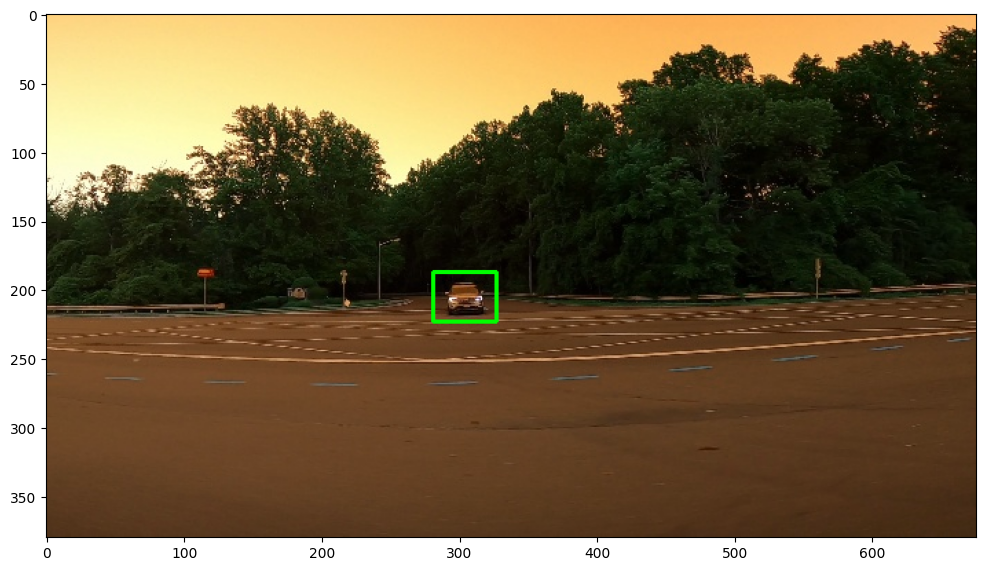

In [15]:
img_file="vid_4_1000.jpg" #入力するのはファイルのパスじゃなくてファイル名なので注意
plot_img_box(img_file,df) #座標が正規化されていると表示されないので注意

In [16]:
device=torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model=fasterrcnn_resnet50_fpn_v2(pretrained=True)
model.to(device)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth
100%|██████████| 167M/167M [00:02<00:00, 85.0MB/s] 


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [17]:
#ファインチューニング
num_classes=2 #車とそれ以外の２クラス
in_f=model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor=FastRCNNPredictor(in_f,num_classes)
model.to(device)
print(model.roi_heads.box_predictor)

FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=2, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=8, bias=True)
)


In [18]:
#モデルの学習
epochs=20
optimizer=torch.optim.Adam(model.parameters(),lr=0.0001)
train_loss_history=[]

for epoch in range(epochs) :
    train_loss=0
     
    for img,target in train_dataloader: #各バッチを取り出す 画像とtarget[{"boxes":値,"labels":値}]
        targets=[]
        optimizer.zero_grad()
        img=list(image for image in img.to(device))
        for i in range(len(img)):
            targets.append({"boxes":target[0]["boxes"][i].to(device),"labels":target[0]["labels"][i].to(device)})

        model.train()
        loss_dict=model(img,targets) #物体検出モデルに損失関数が含まれているので注意 画像からの予測と正解から誤差を算出する
        losses=sum(loss for loss in loss_dict.values()) #loss_dictを合計する
        loss_value=losses.item() #torch.Tensorの要素をint型に変換する
        train_loss+=loss_value
        losses.backward()
        optimizer.step() #パラメータ更新
    
    train_loss/=len(train_dataloader)
    train_loss_history.append(train_loss)
              
    print("Epoch:{}  Train_Loss:{}".format(epoch+1,train_loss))

Epoch:1  Train_Loss:0.18867321452125907
Epoch:2  Train_Loss:0.16579784462228417
Epoch:3  Train_Loss:0.1682381486520171
Epoch:4  Train_Loss:0.1654400449246168
Epoch:5  Train_Loss:0.1582597811706364
Epoch:6  Train_Loss:0.15219189086928964
Epoch:7  Train_Loss:0.14399974243715405
Epoch:8  Train_Loss:0.13232288723811508
Epoch:9  Train_Loss:0.13462876463308932
Epoch:10  Train_Loss:0.12960345949977636
Epoch:11  Train_Loss:0.1257311406545341
Epoch:12  Train_Loss:0.12120969006791711
Epoch:13  Train_Loss:0.11453186878934503
Epoch:14  Train_Loss:0.11388131673447788
Epoch:15  Train_Loss:0.10506638493388891
Epoch:16  Train_Loss:0.10779899461194872
Epoch:17  Train_Loss:0.10482188584282995
Epoch:18  Train_Loss:0.10648416713811457
Epoch:19  Train_Loss:0.10013698884285986
Epoch:20  Train_Loss:0.1019804272800684


[{'boxes': tensor([[  0.4985, 199.0674,  60.5350, 246.7573],
        [ 91.1112, 180.5180, 256.6096, 231.9317]]), 'labels': tensor([1, 1]), 'scores': tensor([0.8745, 0.3840])}]


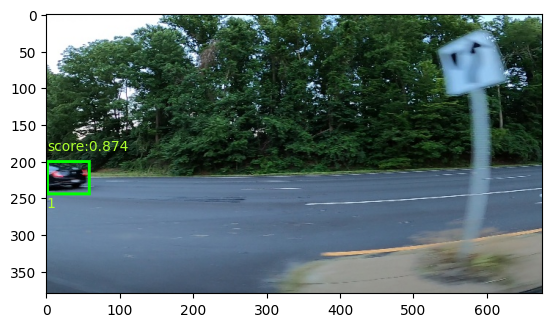

[{'boxes': tensor([[308.3773, 187.3723, 424.8585, 238.2185],
        [  0.0000, 215.9314,  66.0513, 263.1251]]), 'labels': tensor([1, 1]), 'scores': tensor([0.8930, 0.1139])}]


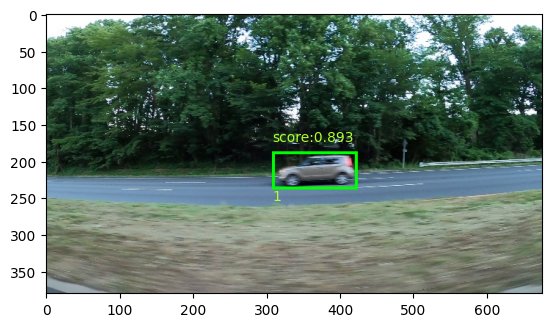

[{'boxes': tensor([[ 39.0105, 191.2203, 147.9981, 237.1062]]), 'labels': tensor([1]), 'scores': tensor([0.9028])}]


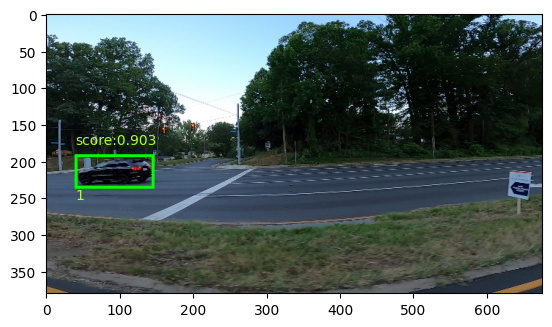

[{'boxes': tensor([[235.6300, 182.2409, 367.2439, 233.8904],
        [476.4466, 181.5967, 576.2756, 214.7241]]), 'labels': tensor([1, 1]), 'scores': tensor([0.8904, 0.8248])}]


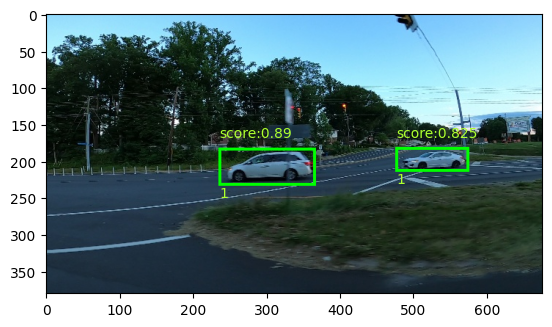

[{'boxes': tensor([[ 79.0297, 190.5494, 193.7815, 233.8176],
        [334.3511, 191.5174, 424.2317, 224.6313],
        [547.8596, 180.1457, 668.4245, 227.7706],
        [643.0391, 179.2757, 675.7368, 211.1792],
        [173.0835, 195.6961, 229.1828, 226.4854],
        [550.8799, 182.1592, 627.9926, 219.2340]]), 'labels': tensor([1, 1, 1, 1, 1, 1]), 'scores': tensor([0.8764, 0.8496, 0.8429, 0.6121, 0.2664, 0.1006])}]


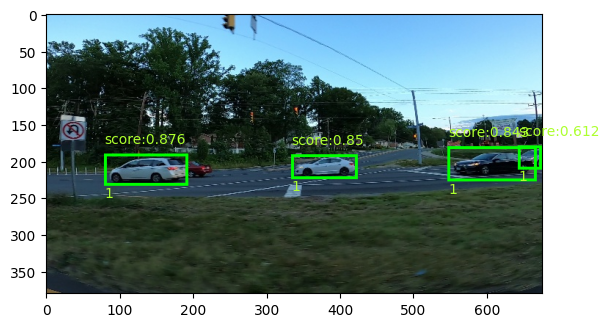

[{'boxes': tensor([[1.8086e+02, 1.9538e+02, 2.6899e+02, 2.2842e+02],
        [3.8994e+02, 1.8940e+02, 5.1292e+02, 2.3391e+02],
        [5.2737e+02, 1.7637e+02, 6.2946e+02, 2.1550e+02],
        [2.5778e-01, 1.9577e+02, 6.2459e+01, 2.3388e+02],
        [4.8875e+01, 2.0096e+02, 1.1301e+02, 2.2806e+02],
        [6.4072e+02, 1.8286e+02, 6.7496e+02, 2.1425e+02]]), 'labels': tensor([1, 1, 1, 1, 1, 1]), 'scores': tensor([0.8647, 0.8574, 0.8569, 0.8314, 0.6854, 0.5803])}]


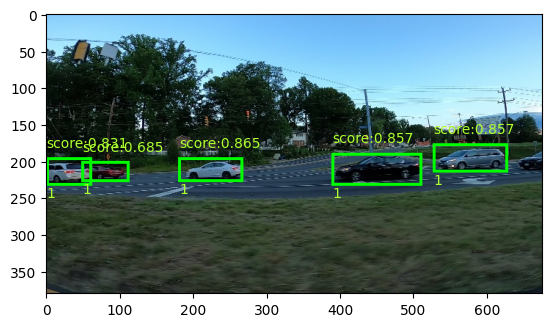

[{'boxes': tensor([[213.1349, 194.8139, 329.2735, 239.3643],
        [ 61.2491, 200.2519, 139.6535, 228.0056],
        [403.3075, 183.5623, 501.6933, 224.3143],
        [586.5577, 174.7155, 671.5287, 214.1130],
        [509.3621, 183.5847, 624.8022, 226.8505]]), 'labels': tensor([1, 1, 1, 1, 1]), 'scores': tensor([0.8831, 0.8595, 0.8587, 0.8120, 0.6712])}]


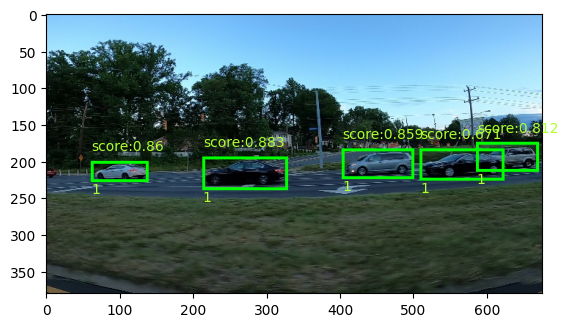

[{'boxes': tensor([[ 58.8296, 198.4866, 162.4675, 236.4879],
        [452.7461, 177.6817, 551.8047, 217.3813],
        [263.0076, 187.2467, 359.3376, 228.7400],
        [  0.0000, 200.0712,  41.7349, 228.3703],
        [348.4245, 191.2392, 460.7178, 234.0152]]), 'labels': tensor([1, 1, 1, 1, 1]), 'scores': tensor([0.8571, 0.8364, 0.8190, 0.7757, 0.7508])}]


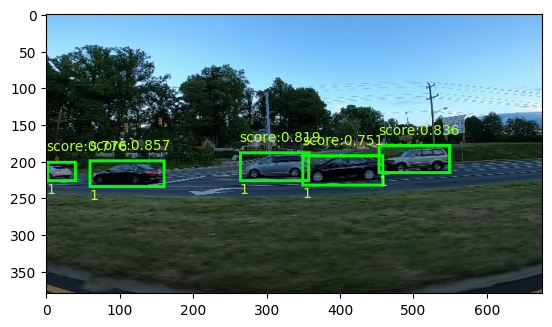

[{'boxes': tensor([[ 29.2738, 191.2608, 143.3346, 234.8933],
        [168.3059, 188.7206, 263.3237, 227.0899],
        [355.0884, 190.5074, 467.3523, 233.5759]]), 'labels': tensor([1, 1, 1]), 'scores': tensor([0.8568, 0.8346, 0.0634])}]


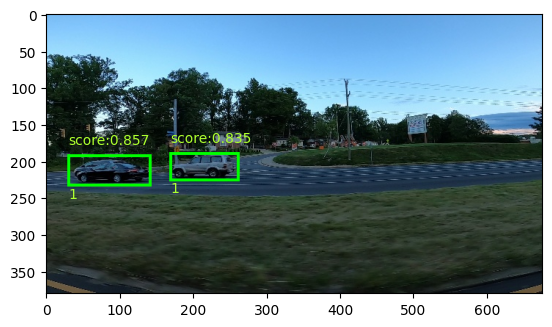

[{'boxes': tensor([[1.7721e+02, 1.9575e+02, 2.8835e+02, 2.3609e+02],
        [2.9009e-01, 1.9778e+02, 4.5018e+01, 2.3242e+02],
        [3.0841e+02, 1.8370e+02, 4.0499e+02, 2.2655e+02],
        [1.2752e+02, 1.9146e+02, 2.2440e+02, 2.2600e+02],
        [1.3355e+02, 3.2828e+02, 2.6668e+02, 3.8000e+02]]), 'labels': tensor([1, 1, 1, 1, 1]), 'scores': tensor([0.8744, 0.8364, 0.8220, 0.7723, 0.2973])}]


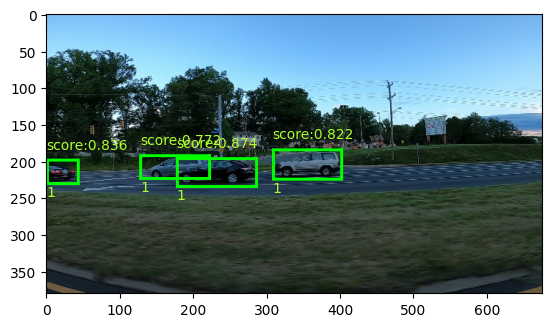

[{'boxes': tensor([[396.8284, 181.7010, 524.3820, 233.3659],
        [517.4616, 184.8075, 601.0111, 217.4516],
        [  0.0000, 212.0547,  55.2814, 248.5829],
        [ 25.7003, 177.6807, 149.0282, 226.2235],
        [ 62.9239, 200.6188, 141.0373, 234.1967]]), 'labels': tensor([1, 1, 1, 1, 1]), 'scores': tensor([0.7994, 0.7698, 0.2578, 0.0642, 0.0528])}]


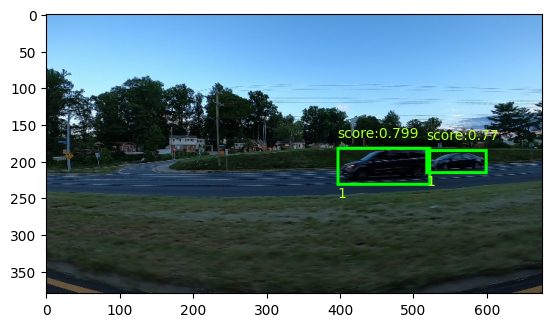

[{'boxes': tensor([[ 55.0219, 195.8677, 131.4792, 226.4534],
        [521.9296, 176.2096, 610.9371, 213.2633],
        [409.1870, 181.4675, 526.5442, 227.8203],
        [ 62.7127, 186.9406, 194.8851, 234.4885]]), 'labels': tensor([1, 1, 1, 1]), 'scores': tensor([0.8443, 0.8417, 0.8164, 0.0525])}]


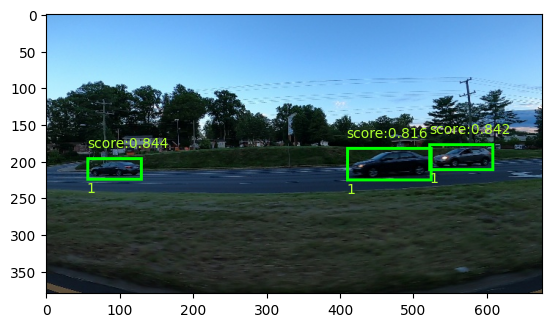

[{'boxes': tensor([[ 55.0219, 195.8677, 131.4792, 226.4534],
        [521.9296, 176.2096, 610.9371, 213.2633],
        [409.1870, 181.4675, 526.5442, 227.8203],
        [ 62.7127, 186.9406, 194.8851, 234.4885]]), 'labels': tensor([1, 1, 1, 1]), 'scores': tensor([0.8443, 0.8417, 0.8164, 0.0525])}]


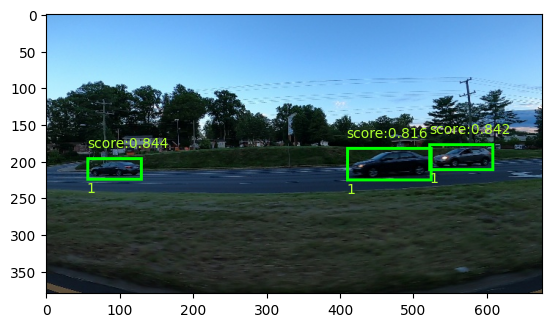

[{'boxes': tensor([[ 60.8511, 196.2726, 140.2521, 229.2232],
        [  0.0000, 212.8553,  56.0554, 248.8105]]), 'labels': tensor([1, 1]), 'scores': tensor([0.8729, 0.0579])}]


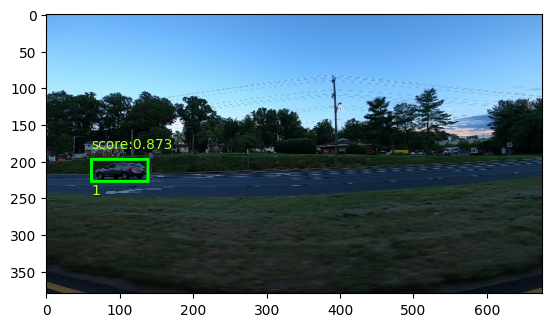

[{'boxes': tensor([[  0.6515, 201.0108, 195.7702, 282.0037],
        [ 84.9771, 213.5403, 197.5513, 278.1960],
        [183.2948, 183.0250, 311.9314, 231.7148]]), 'labels': tensor([1, 1, 1]), 'scores': tensor([0.8466, 0.1107, 0.0710])}]


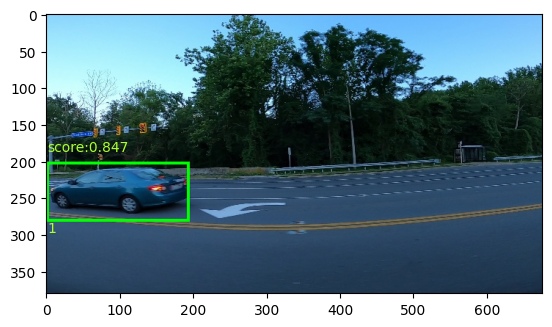

[{'boxes': tensor([[124.2897, 193.7055, 224.0180, 232.5344],
        [245.6132, 243.8671, 352.4888, 284.8386],
        [321.7305, 242.0298, 420.3025, 283.1297],
        [  0.0000, 183.0597,  48.6584, 215.3374],
        [183.9942, 247.4357, 283.9169, 285.7520]]), 'labels': tensor([1, 1, 1, 1, 1]), 'scores': tensor([0.8599, 0.1596, 0.0950, 0.0909, 0.0606])}]


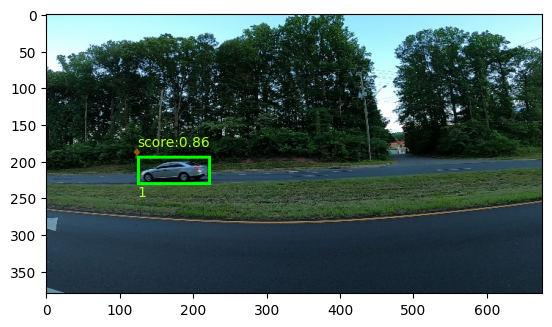

[{'boxes': tensor([[ 74.3763, 191.1762, 170.8304, 228.4998]]), 'labels': tensor([1]), 'scores': tensor([0.8459])}]


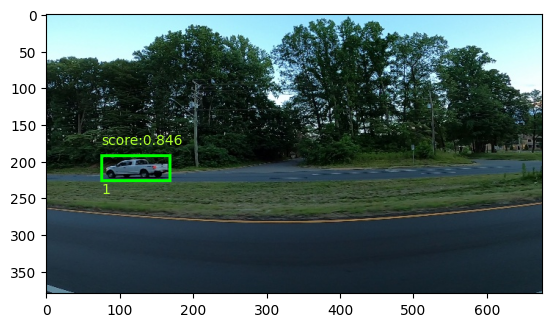

[{'boxes': tensor([[353.6034, 190.4753, 429.9401, 222.4413]]), 'labels': tensor([1]), 'scores': tensor([0.7946])}]


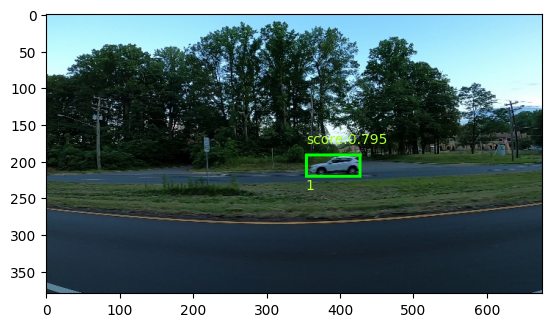

[{'boxes': tensor([[ 43.2502, 171.7731, 145.3591, 213.9281],
        [632.4677, 171.8858, 676.0001, 198.5298],
        [213.0378, 170.7067, 309.1651, 208.5867]]), 'labels': tensor([1, 1, 1]), 'scores': tensor([0.2308, 0.2026, 0.0909])}]


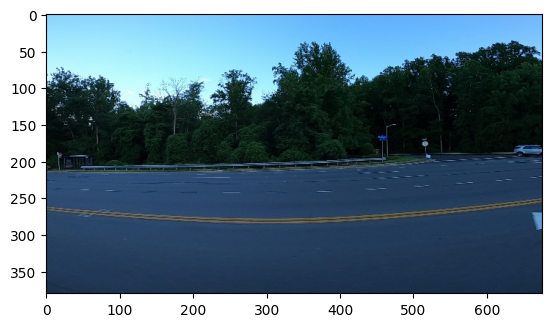

[{'boxes': tensor([[ 65.0238, 181.8245, 170.0124, 219.2549]]), 'labels': tensor([1]), 'scores': tensor([0.0685])}]


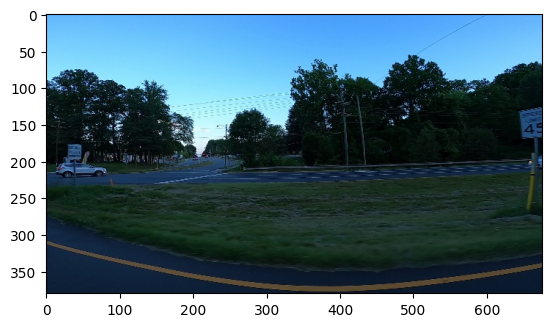

[{'boxes': tensor([[519.8886, 169.4444, 593.8552, 203.6054],
        [ 36.2769, 171.7141, 139.6249, 207.4019],
        [  0.0000, 223.4447,  57.6255, 269.6897]]), 'labels': tensor([1, 1, 1]), 'scores': tensor([0.8640, 0.3395, 0.1205])}]


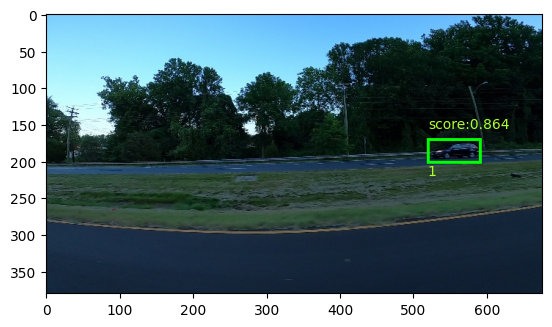

[{'boxes': tensor([[429.4630, 173.4576, 519.2674, 208.8383],
        [  0.0000, 192.9286,  35.6307, 219.7702]]), 'labels': tensor([1, 1]), 'scores': tensor([0.8371, 0.6532])}]


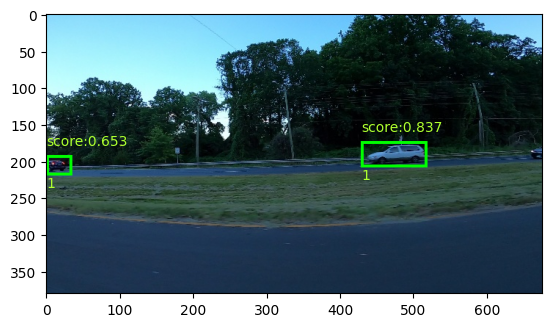

[{'boxes': tensor([[  0.0000, 191.0071,  66.9622, 220.9482],
        [127.7623, 166.6221, 243.6134, 206.9487]]), 'labels': tensor([1, 1]), 'scores': tensor([0.8166, 0.1565])}]


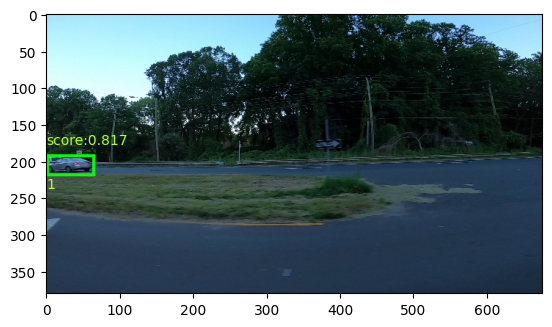

[{'boxes': tensor([[136.6000, 185.1368, 302.9253, 251.9299],
        [510.8575, 171.4529, 602.6447, 208.5920],
        [507.8624, 185.8622, 585.2009, 213.6889],
        [593.2733, 156.7984, 674.2386, 202.4940],
        [  0.0000, 218.6358,  53.6495, 252.5754],
        [ 45.9622, 181.0959, 142.1008, 214.6245]]), 'labels': tensor([1, 1, 1, 1, 1, 1]), 'scores': tensor([0.8719, 0.1924, 0.1160, 0.1143, 0.0833, 0.0577])}]


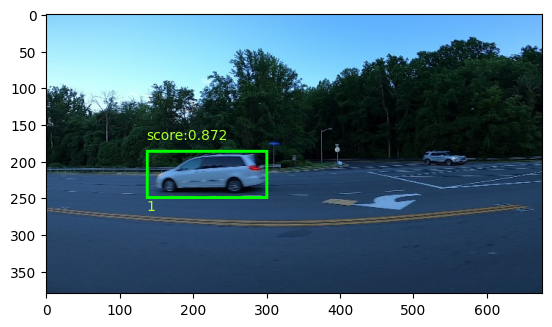

[{'boxes': tensor([[367.4477, 175.8472, 532.5060, 230.2319],
        [  9.5053, 189.8236, 104.1720, 231.5290]]), 'labels': tensor([1, 1]), 'scores': tensor([0.8997, 0.8544])}]


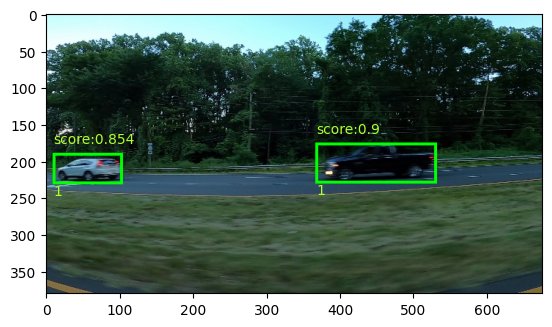

[{'boxes': tensor([[ 76.1368, 185.9561, 215.2603, 236.9440],
        [498.7961, 175.0325, 618.4047, 218.3429],
        [199.1476, 194.3529, 279.9162, 227.6995]]), 'labels': tensor([1, 1, 1]), 'scores': tensor([0.8743, 0.8741, 0.8468])}]


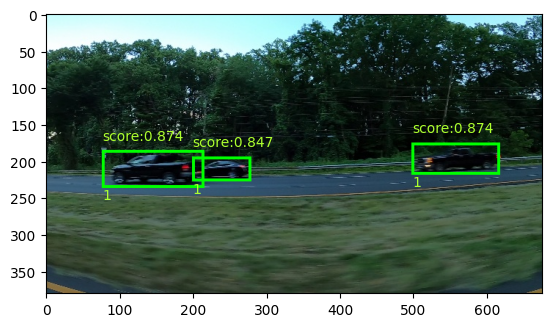

[{'boxes': tensor([[254.3669, 187.5823, 380.6942, 238.1004],
        [ 54.8419, 193.0011, 146.5132, 231.5882]]), 'labels': tensor([1, 1]), 'scores': tensor([0.8753, 0.8735])}]


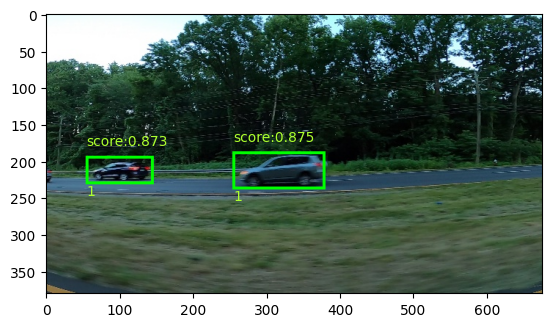

[{'boxes': tensor([[106.9681, 192.6949, 223.3338, 242.6190],
        [562.6849, 175.2973, 675.5684, 226.4960],
        [243.3586, 192.3249, 337.4640, 231.4703],
        [  0.0000, 197.6090,  45.4750, 229.3317]]), 'labels': tensor([1, 1, 1, 1]), 'scores': tensor([0.8970, 0.8826, 0.8566, 0.7854])}]


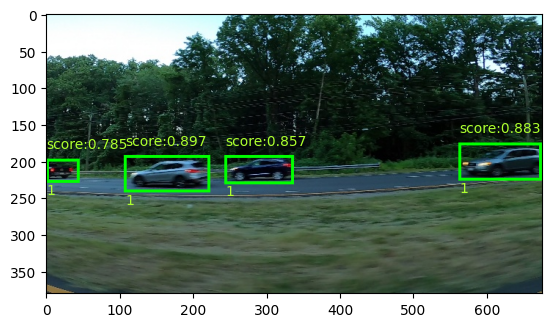

[{'boxes': tensor([[456.9215, 178.3418, 574.2686, 224.6375],
        [  0.0000, 199.6805,  48.7564, 229.6257],
        [254.9406, 179.1891, 441.9897, 248.4228],
        [369.2011, 190.4620, 454.1378, 229.4079]]), 'labels': tensor([1, 1, 1, 1]), 'scores': tensor([0.9028, 0.8404, 0.7744, 0.0526])}]


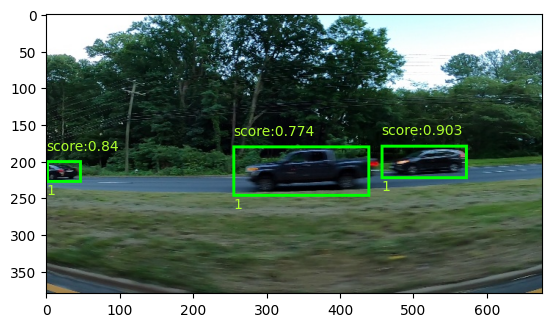

[{'boxes': tensor([[ 11.2035, 193.9104, 100.7862, 233.7908],
        [630.4041, 179.0373, 674.0167, 217.6231],
        [132.4103, 181.8390, 289.7400, 235.3468],
        [243.0059, 173.7313, 358.1258, 218.7042]]), 'labels': tensor([1, 1, 1, 1]), 'scores': tensor([0.8557, 0.7839, 0.2342, 0.1079])}]


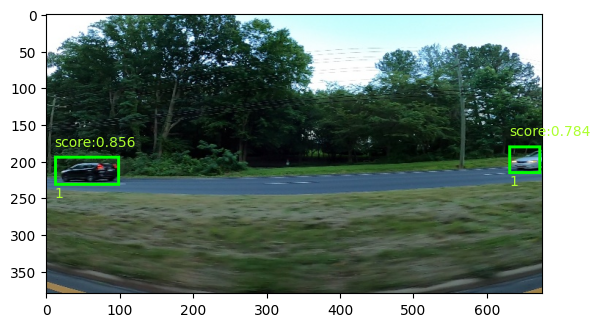

[{'boxes': tensor([[  0.0000, 200.4217,  48.2759, 233.8992]]), 'labels': tensor([1]), 'scores': tensor([0.8715])}]


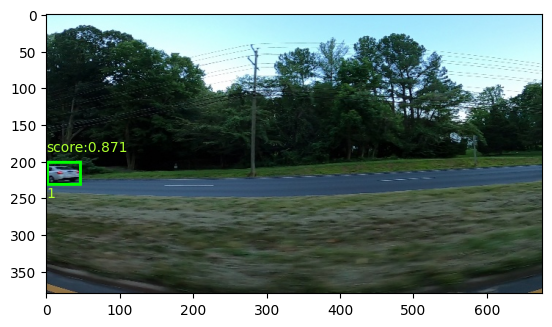

[{'boxes': tensor([[  0.0000, 176.7839, 138.2051, 254.3342],
        [576.1790, 155.6019, 675.8370, 209.5901]]), 'labels': tensor([1, 1]), 'scores': tensor([0.8647, 0.1588])}]


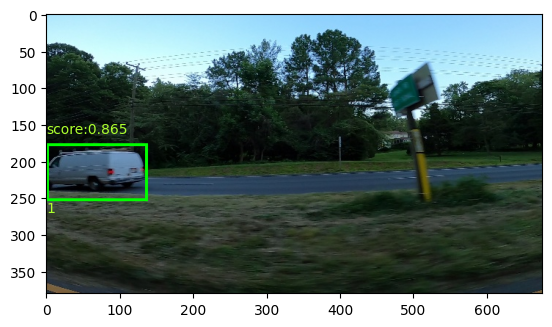

In [19]:
#学習済みモデルを用いて、画像から物体検出を行う
model.eval() #推論モード
cpu_device=torch.device("cpu")
model.to(cpu_device)
with torch.no_grad():
    for i,(img,target) in enumerate(test_dataloader): #この形式じゃないと値が空になってしまうので注意
        img=list(image.to(cpu_device) for image in img)
        test_img=random.choice(img) #リストからランダムに１つの要素を取り出す
        input=test_img.unsqueeze(0).to(cpu_device) #unsqueeze(0)で次元を追加してtest_img[3,224,224]を[1,3,224,224]にしている
        output=model(input.to(cpu_device)) #boxの予測
        print(output) #予測の確認
        
        fig,ax=plt.subplots()
        image=transforms.ToPILImage()(test_img) #tensorをImage objectに変換
        draw_im=ImageDraw.Draw(image) 
        for j in range(len(output[0]["labels"])): #１つの画像に対しての予測を順番に格納し、描画していく
            box={}
            #予測したラベルと各座標とスコアを格納
            box["label"]=output[0]["labels"][j]
            box["xmin"]=output[0]["boxes"][j][0]
            box["ymin"]=output[0]["boxes"][j][1]
            box["xmax"]=output[0]["boxes"][j][2]
            box["ymax"]=output[0]["boxes"][j][3]
            box["score"]=output[0]["scores"][j]
            
            if box["score"]>0.60: #予測のscoreが0.6よりも大きいものを描画する
                draw_im.rectangle((box["xmin"], box["ymin"],box["xmax"], box["ymax"]), outline=(0,255,0),width=4) #Image objectにboxを描画
                ax.text(box["xmin"],box["ymax"]+15,box["label"].item(),size=10,color="greenyellow") #Image objectにlabelを描画
                ax.text(box["xmin"],box["ymin"]-15,"score:"+str(round(box["score"].item(),3)),size=10,color="greenyellow") #Image objectにscoreを描画                                    
                    
        plt.imshow(image)
        plt.show()